# 프로젝트 설명

In [1]:
import sys; sys.path.append("..") 
from src.utility import *

project_name = "dual_attention"
createfolder("./data")
createfolder("./model")
createfolder("./result")
createfolder("./graph")

data_path = './data'
model_path = './model'
result_path = './result'
graph_path = './graph'

## Raw data

In [2]:
raw_data = loadfile(data_path, "raw data", 'csv')
display(raw_data.info())
display(raw_data.describe())

csv file is loaded from ./data/raw data.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83701 entries, 0 to 83700
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Month            83701 non-null  int64  
 1   Day              83701 non-null  int64  
 2   Hour             83701 non-null  int64  
 3   Minute           83701 non-null  int64  
 4   FT-3061-2        83701 non-null  float64
 5   TT-3061-1        83701 non-null  float64
 6   TT-3061-2        83701 non-null  float64
 7   PT-3061-2        83701 non-null  float64
 8   FT-3061-4        83701 non-null  float64
 9   TT-3061-5        83701 non-null  float64
 10  TT-3061-3        83701 non-null  float64
 11  TT-3061-4        83701 non-null  float64
 12  TT-3061-6        83701 non-null  float64
 13  PT-3061-3 (old)  83701 non-null  float64
 14  LT-3061-2        83701 non-null  float64
 15  FT-3061-3        83701 non-null  float64
 16  FT-3062-1     

None

,Month,Day,Hour,Minute,FT-3061-2,TT-3061-1,TT-3061-2,PT-3061-2,FT-3061-4,TT-3061-5,TT-3061-3,TT-3061-4,TT-3061-6,PT-3061-3 (old),LT-3061-2,FT-3061-3,FT-3062-1
count,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000,83701.000000
mean,11.139795,15.541977,11.477318,29.499648,29.559141,29.222028,25.539743,-0.430313,22.591501,30.624912,48.269577,66.736512,63.175855,-0.329969,28.591552,56.274025,24.231841
std,0.681425,8.967264,6.931991,17.318402,35.428486,21.361876,17.809541,0.475763,26.384841,22.120893,39.597746,55.663624,51.600359,0.375344,30.572621,62.235262,31.711250
min,10.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.993000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.940000,0.000000,0.000000,0.000000
25%,11.000000,8.000000,5.000000,14.000000,0.000000,8.000000,7.100000,-0.960000,0.000000,6.800000,7.000000,8.700000,8.900000,-0.720000,0.000000,0.000000,0.000000
50%,11.000000,15.000000,11.000000,29.000000,0.800000,17.600000,25.000000,-0.013000,0.000000,40.600000,38.500000,62.000000,60.600000,-0.015000,24.200000,0.000000,24.600000
75%,12.000000,24.000000,17.000000,44.000000,65.700000,52.600000,42.100000,-0.001000,48.600000,45.800000,88.700000,126.600000,118.900000,-0.004000,52.800000,123.200000,42.600000
max,12.000000,31.000000,23.000000,59.000000,200.000000,57.200000,108.800000,0.214000,225.400000,113.500000,126.700000,137.700000,128.700000,0.459000,100.000000,300.000000,1092.100000


# Data preprocessing

In [3]:
# Define variables
input_var   = ["FT-3061-2", "FT-3061-3", "FT-3061-4", "FT-3062-1"]
output_var  = ["TT-3061-3", "TT-3061-5", "LT-3061-2"]
process_var = input_var + output_var

## data clustering

In [4]:
from src import clustering

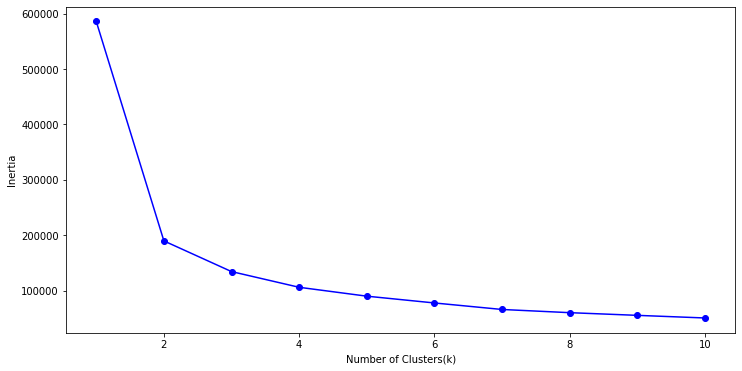

In [5]:
kmean_test = clustering.KmeanCluster(raw_data, target_var=process_var)
kmean_test.test_inertia()

cluster 2


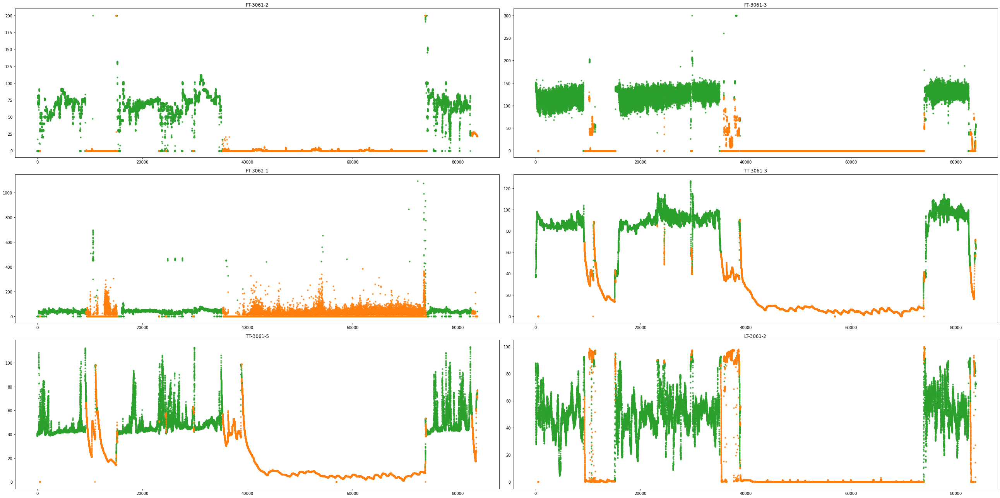

cluster 3


<Figure size 432x288 with 0 Axes>

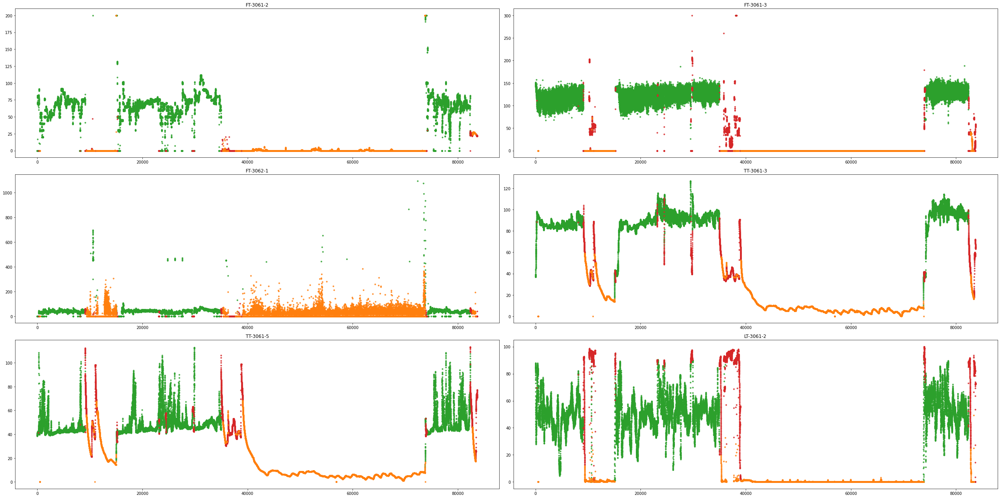

cluster 4


<Figure size 432x288 with 0 Axes>

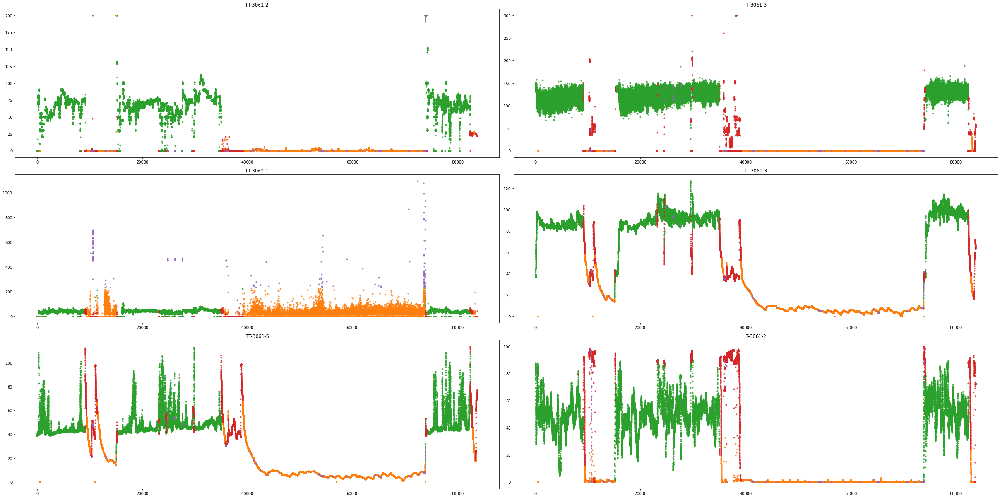

cluster 5


<Figure size 432x288 with 0 Axes>

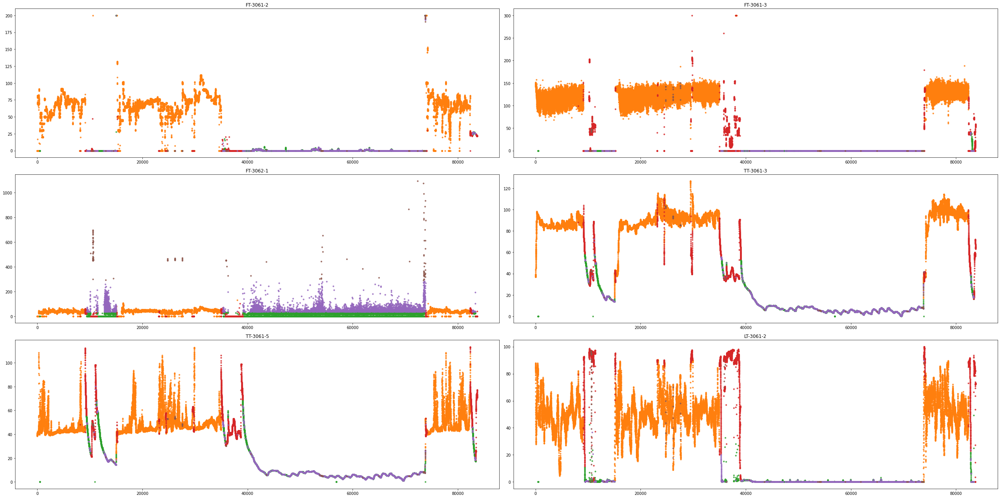

cluster 6


<Figure size 432x288 with 0 Axes>

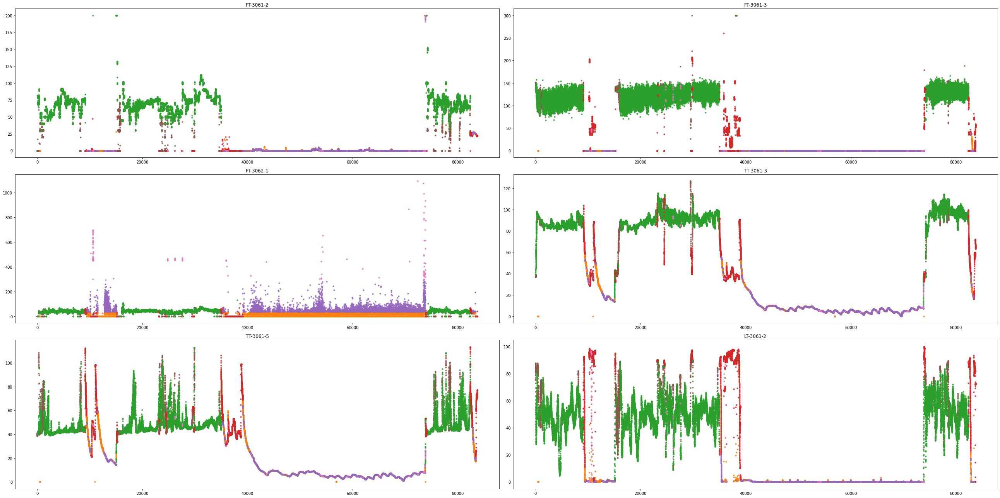

cluster 7


<Figure size 432x288 with 0 Axes>

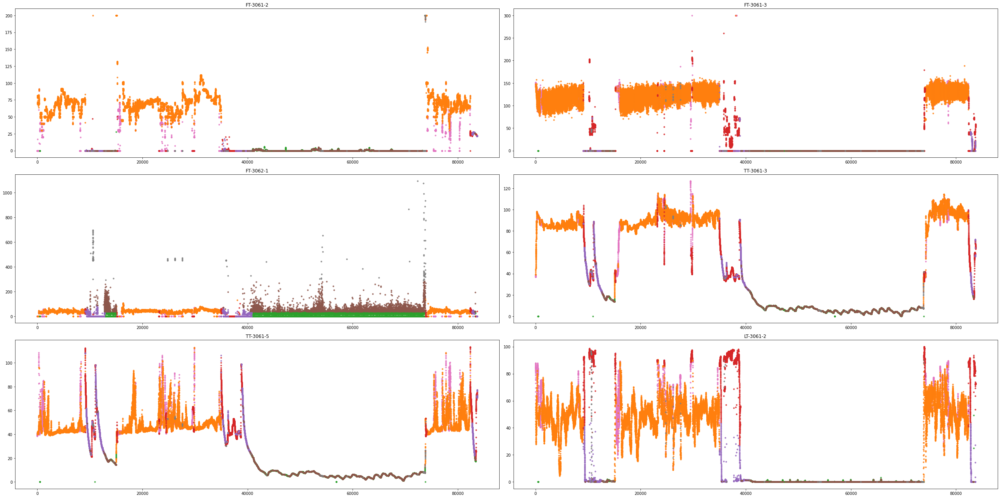

cluster 8


<Figure size 432x288 with 0 Axes>

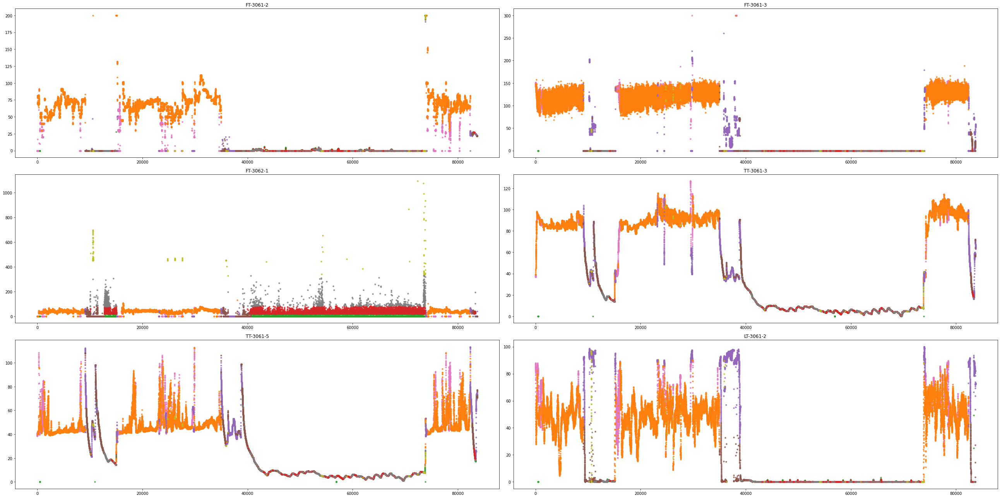

cluster 9


<Figure size 432x288 with 0 Axes>

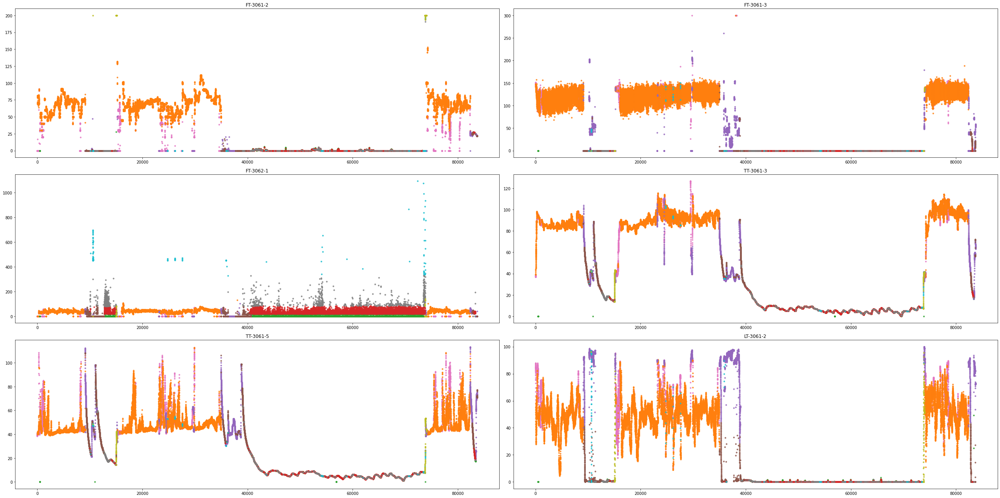

<Figure size 432x288 with 0 Axes>

In [6]:
# plot information
plot_var = ["FT-3061-2", "FT-3061-3", "FT-3062-1", "TT-3061-3", "TT-3061-5", "LT-3061-2"]
save_fig = False

for i in range(2,10):
    print(f"cluster {i}")
    kmean_test.model(i)
    kmean_test.plot(plot_var=plot_var,
                       fig_ratio=(3,1), subplot=(3,2),
                       fig_name=f"cluster{i}", save_fig=save_fig)

number of clusters: 2


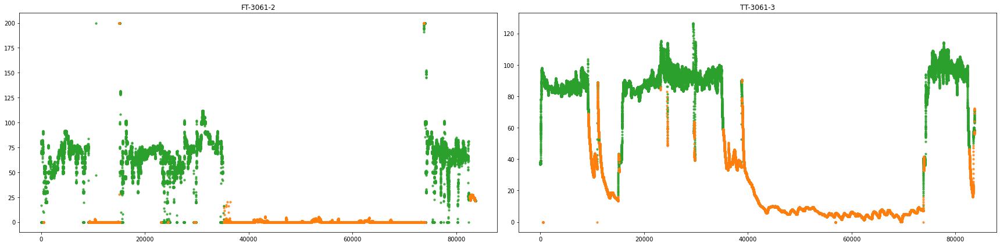

number of clusters: 3


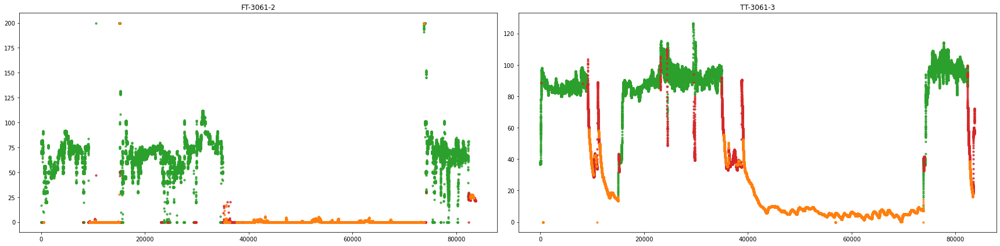

number of clusters: 4


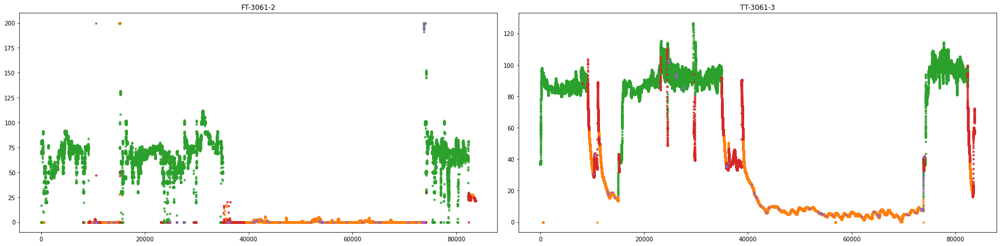

number of clusters: 5


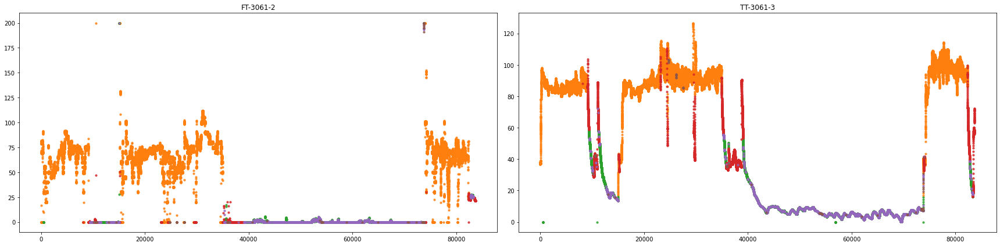

number of clusters: 6


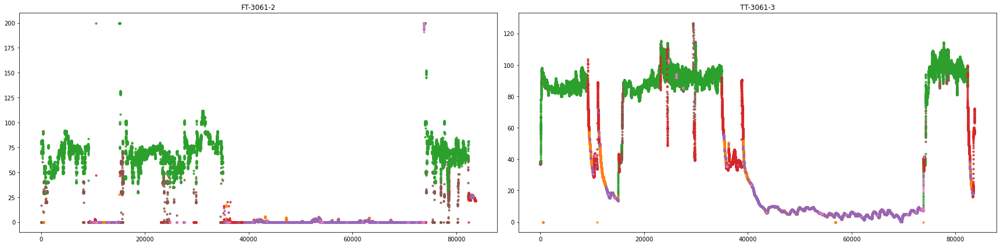

number of clusters: 7


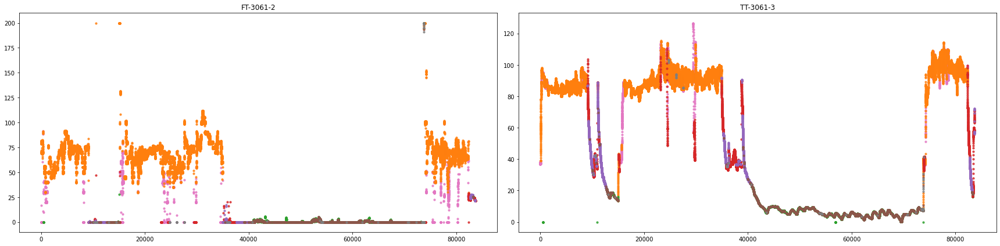

number of clusters: 8


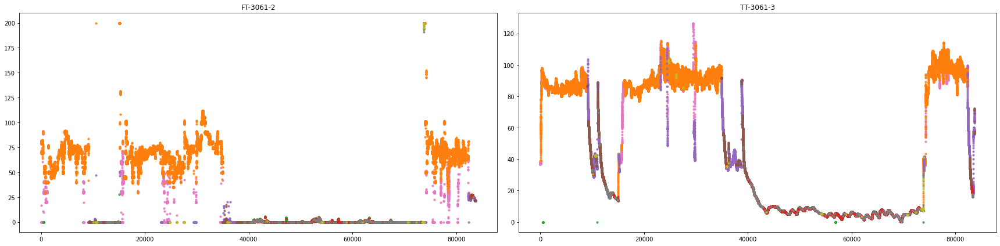

number of clusters: 9


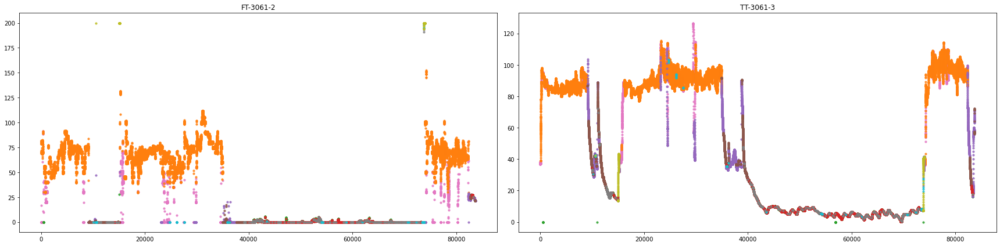

number of clusters: 10


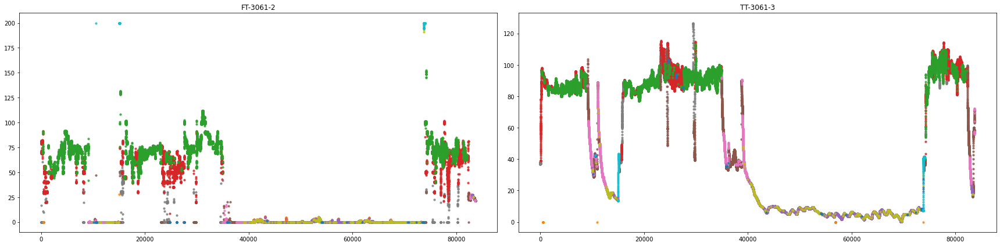

number of clusters: 11


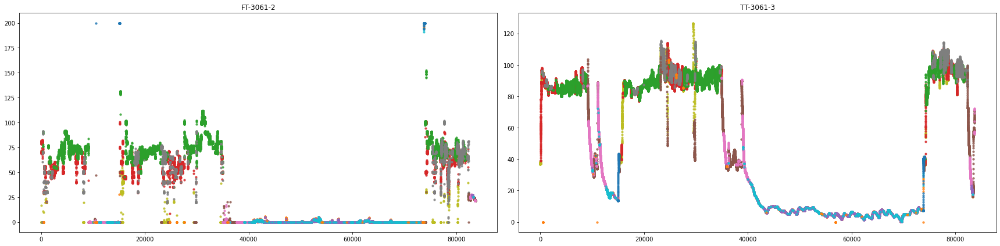

In [7]:
cluster_path = data_path + '/1_cluster'
createfolder(cluster_path)

for num_cluster in range(2,12):
    print(f"number of clusters: {num_cluster}")
    kmean = clustering.KmeanCluster(raw_data, target_var=process_var)
    kmean.model(num_cluster=num_cluster)
    kmean.plot(['FT-3061-2', 'TT-3061-3'], fig_ratio=(2,1), subplot=(1,2))
    df_cluster = kmean.df
    df_on = df_cluster[df_cluster['color']==df_cluster['color'].iloc[5000]]
    
    if not exists(f"{cluster_path}/cluster_{num_cluster}.csv"):
        savefile(df_on, cluster_path, f'cluster_{num_cluster}', 'csv')

운전데이터를 최대한 깔끔하게 분리하기 위해 cluster의 개수를 증가시킴

Cluster 개수가 9개부터 운전데이터가 2 덩어리로 분리되었음.

--> __최대한 많은 운전데이터를 보존하기 위해 cluster 개수를 8개로 설정__

In [8]:
df_cluster = loadfile(cluster_path, "cluster_8", 'csv')
df_cluster.describe()

csv file is loaded from ./data/1_cluster/cluster_8.csv


,Month,Day,Hour,Minute,FT-3061-2,TT-3061-1,TT-3061-2,PT-3061-2,FT-3061-4,TT-3061-5,TT-3061-3,TT-3061-4,TT-3061-6,PT-3061-3 (old),LT-3061-2,FT-3061-3,FT-3062-1,cluster
count,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.000000,33161.0
mean,10.980821,13.763879,11.400078,29.476192,70.304095,51.926311,42.071243,-0.955592,48.677808,47.960773,90.278716,125.391050,117.387392,-0.737926,49.227457,123.134456,41.318887,3.0
std,0.688520,7.561436,7.006414,17.275298,15.743448,3.969340,2.695432,0.063553,7.598428,8.064162,8.693145,10.803845,9.745320,0.072236,11.111182,18.579908,12.069504,0.0
min,10.000000,1.000000,0.000000,0.000000,0.000000,15.000000,6.200000,-0.987000,0.000000,7.500000,7.200000,8.400000,8.800000,-0.940000,0.000000,0.000000,0.000000,3.0
25%,11.000000,8.000000,5.000000,15.000000,61.000000,50.500000,41.300000,-0.962000,44.800000,43.300000,85.600000,123.900000,115.700000,-0.766000,43.400000,112.600000,36.000000,3.0
50%,11.000000,13.000000,11.000000,29.000000,70.400000,53.000000,42.300000,-0.960000,48.900000,45.300000,89.900000,127.400000,119.700000,-0.724000,50.000000,125.900000,42.500000,3.0
75%,11.000000,18.000000,18.000000,44.000000,75.800000,54.300000,43.100000,-0.958000,52.800000,49.600000,95.500000,130.300000,121.600000,-0.708000,56.000000,136.800000,47.700000,3.0
max,12.000000,29.000000,23.000000,59.000000,200.000000,57.200000,99.500000,0.188000,122.500000,112.600000,115.600000,137.200000,127.800000,0.184000,96.300000,300.000000,131.100000,3.0


## Domain knowledge

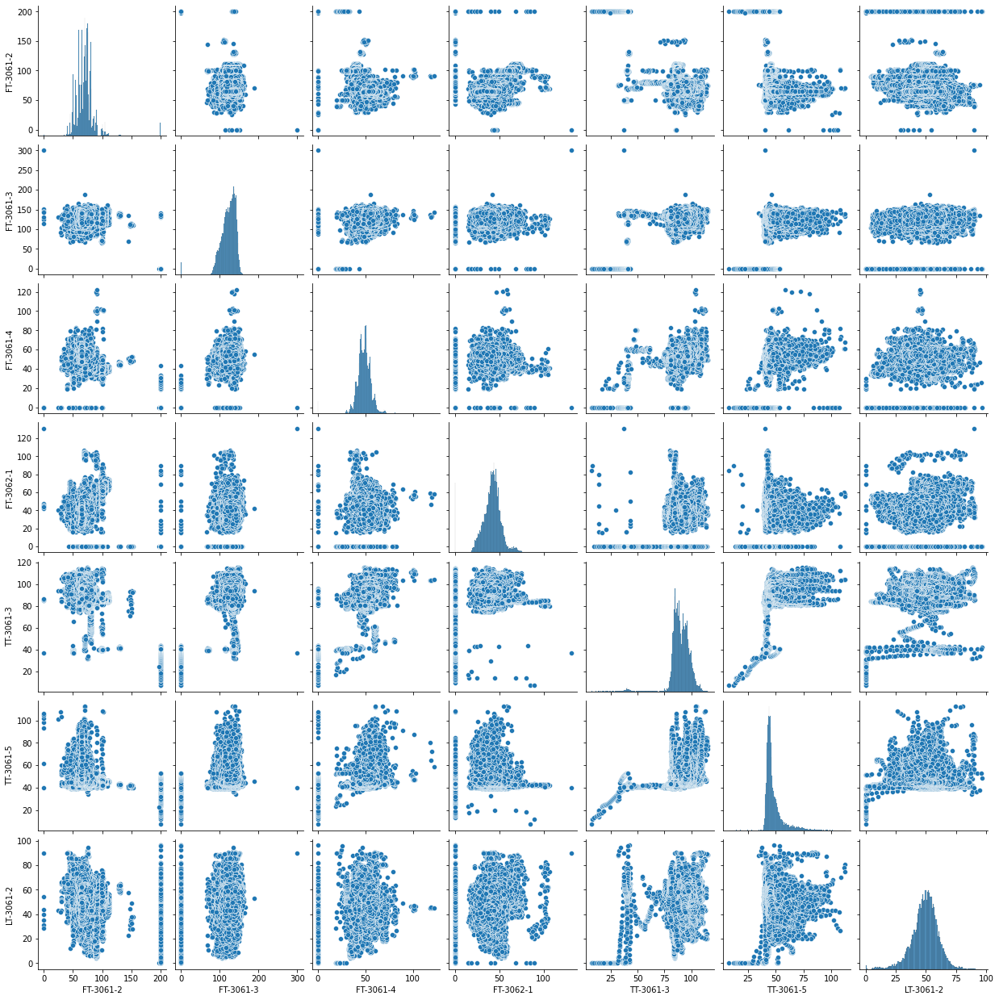

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

domain_path = data_path + '/2_domain'
createfolder(domain_path)

sns.pairplot(df_cluster[process_var])
#plt.savefig("./graph/pairplot/cluster3 df_on process_var.png", dpi=500)


FT-3061-2, FT-3061-3, LT-3061-2 등 여러 공정 변수에서 0 값에 부딪히는 데이터가 많이 존재함.

__--> "운전 데이터는 데이터 값이 0보다 커야 한다는 domain knowledge를 이용하여 데이터 처리__ 

In [10]:
# Remove 0 data

target_data = df_cluster
target_var = process_var

# filter data larger than value 0
df_domain = target_data[(target_data[target_var] > 0).all(axis=1)]

if not exists(f"{domain_path}/cluster_8_domain.csv"):
    savefile(df_domain, domain_path, 'cluster_8_domain')

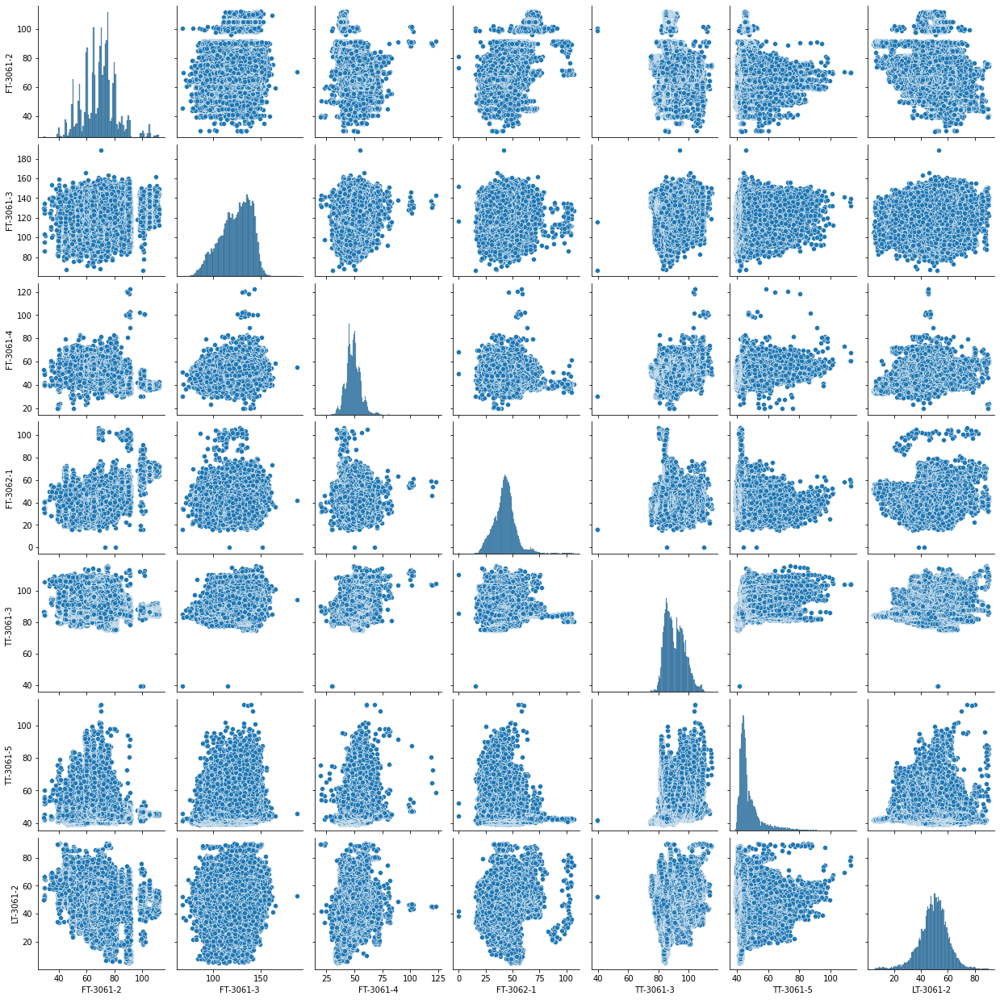

In [11]:
sns.pairplot(df_domain[process_var])

## Filter continuous data

In [12]:
from src.dataprocessing import ctsfilter
continuous_path = data_path + '/3_continuous'

for min_len in [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]:
    cts_list = ctsfilter(df_domain, min_len)
    print()
    
    if not exists(f"{continuous_path}/cts_{min_len}"):
        createfolder(continuous_path + f'/cts_{min_len}')
        for i, cts_df in enumerate(cts_list):
            savefile(cts_df, continuous_path + f'/cts_{min_len}', f"dataset {min_len}_{i+1}")

the number of continuous range [min 100]: 24
total number of data samples: 31468

the number of continuous range [min 200]: 21
total number of data samples: 31066

the number of continuous range [min 300]: 20
total number of data samples: 30831

the number of continuous range [min 400]: 19
total number of data samples: 30459

the number of continuous range [min 500]: 17
total number of data samples: 29545

the number of continuous range [min 600]: 15
total number of data samples: 28450

the number of continuous range [min 700]: 14
total number of data samples: 27790

the number of continuous range [min 800]: 13
total number of data samples: 27065

the number of continuous range [min 900]: 11
total number of data samples: 25326

the number of continuous range [min 1000]: 11
total number of data samples: 25326



최대한 많은 데이터를 보존하기 위해 최소 길이는 짧을수록 좋음.

__--> 최대 history size 40, 최대 prediction size 30을 고려하여 최소 길이를 100으로 설정__

In [18]:
min_len = 100

cts_list = ctsfilter(df_domain, min_len)

the number of continuous range [min 100]: 24
total number of data samples: 31468


dataset 1


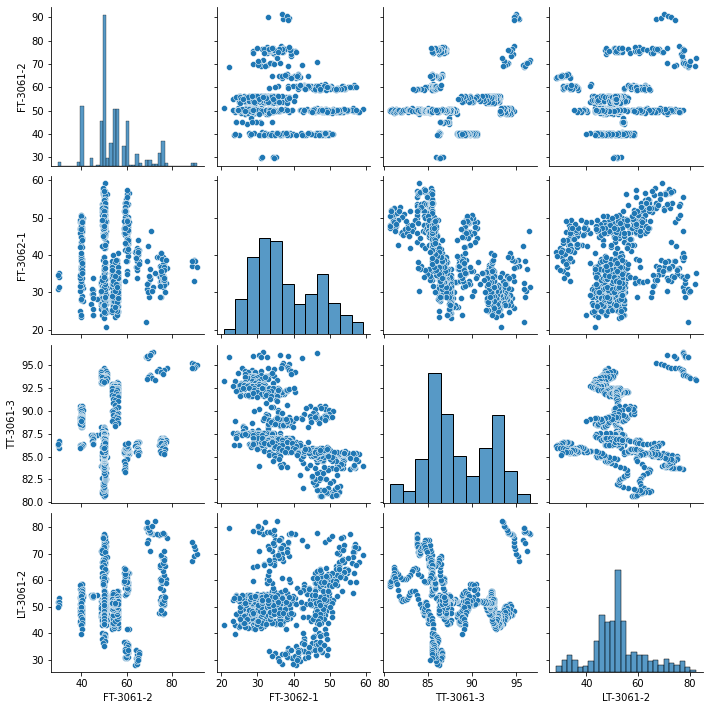

dataset 2


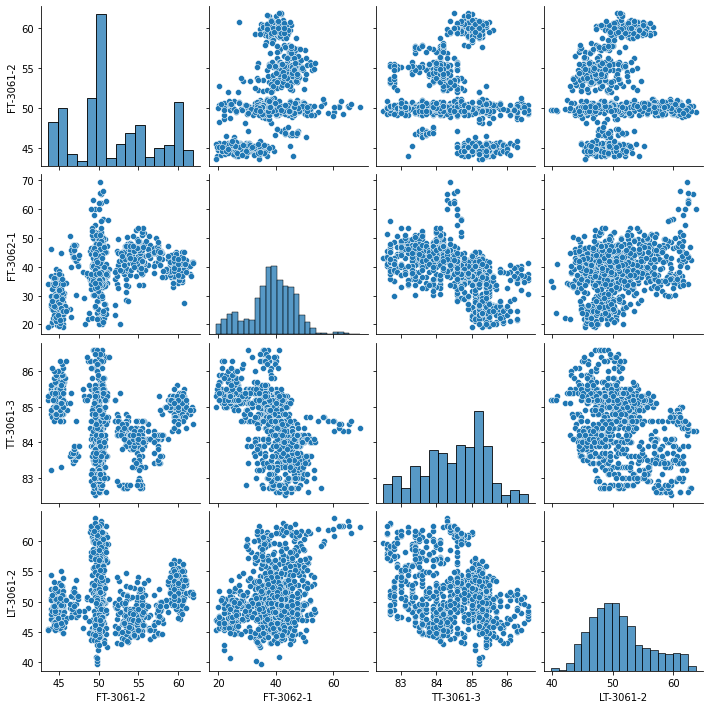

dataset 3


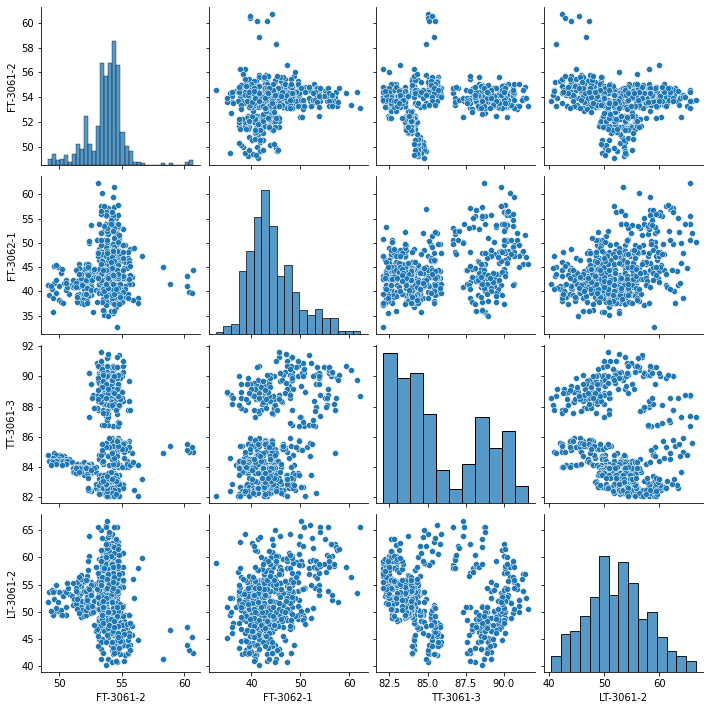

dataset 4


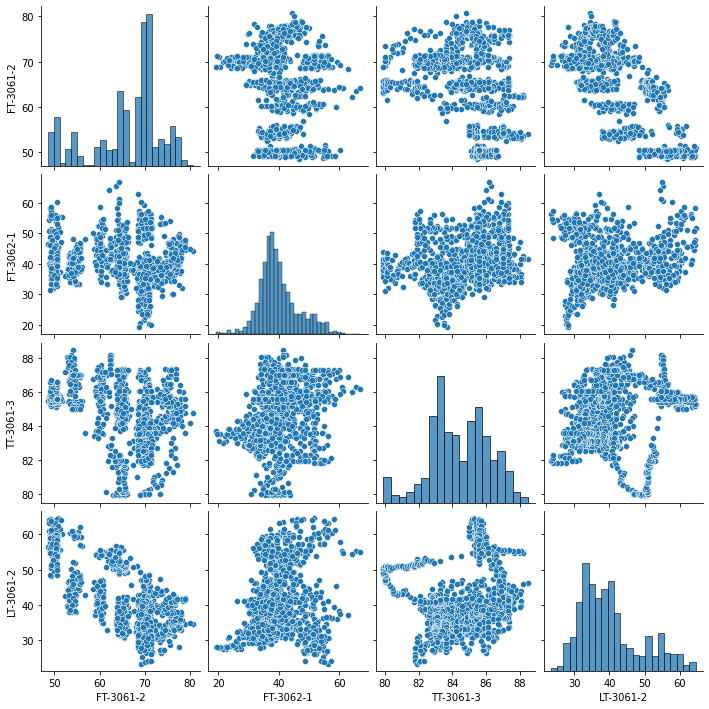

dataset 5


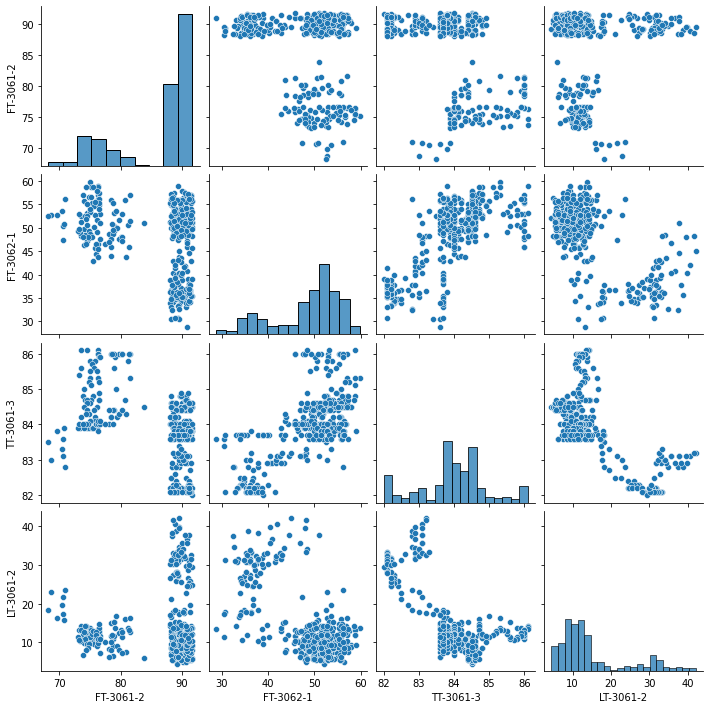

dataset 6


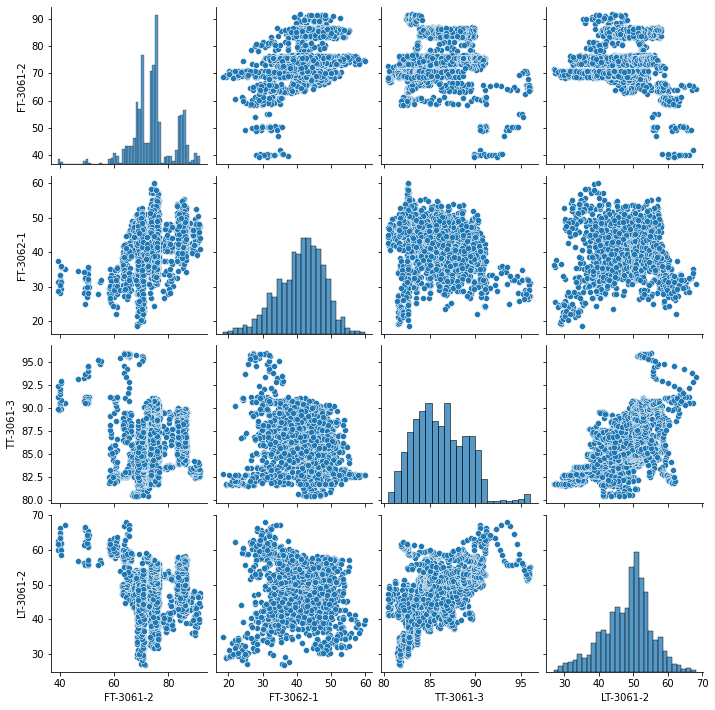

dataset 7


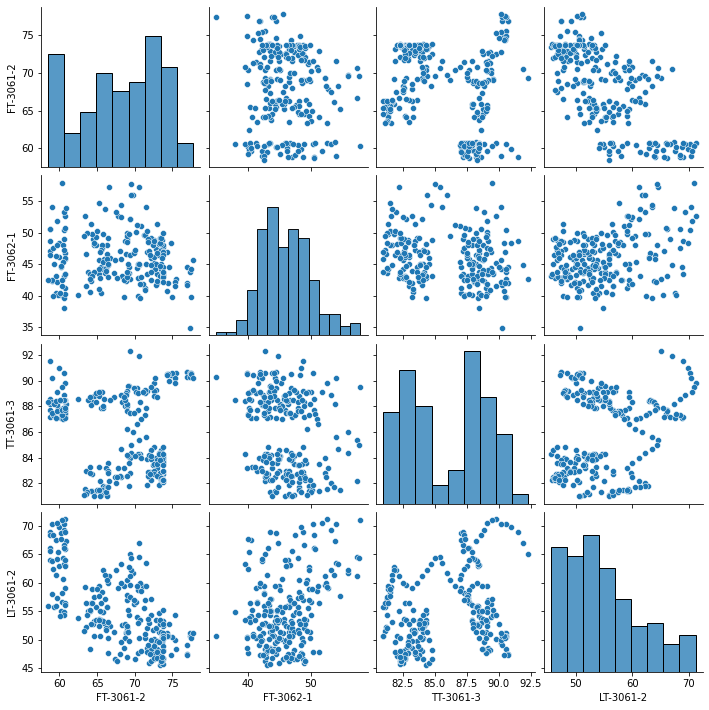

dataset 8


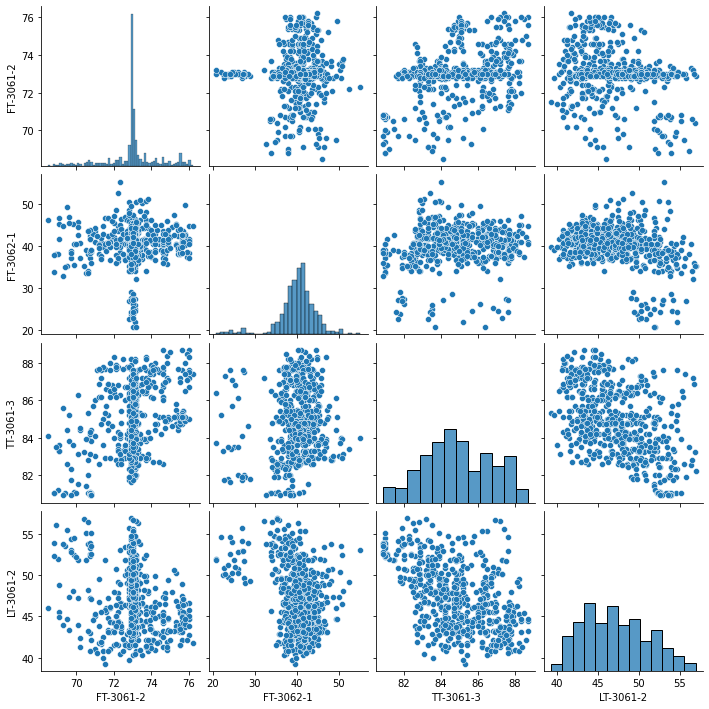

dataset 9


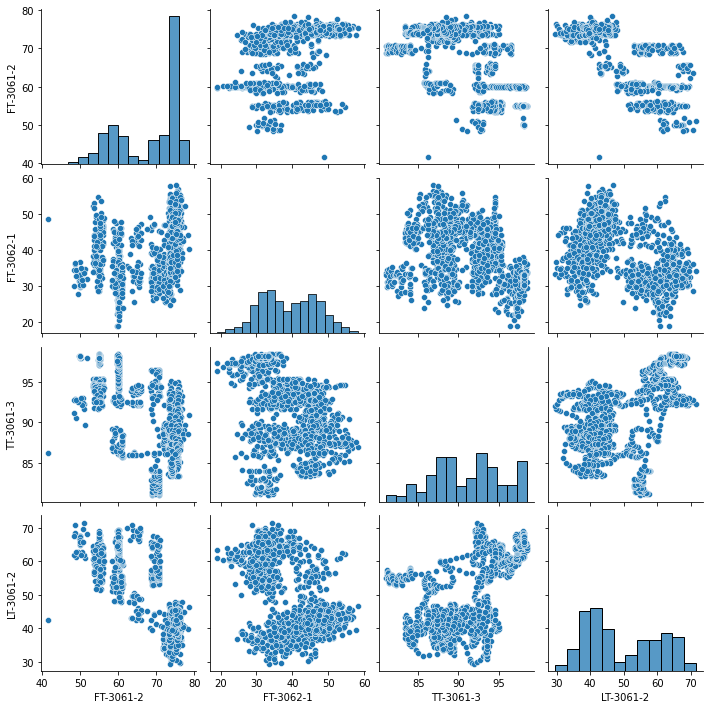

dataset 10


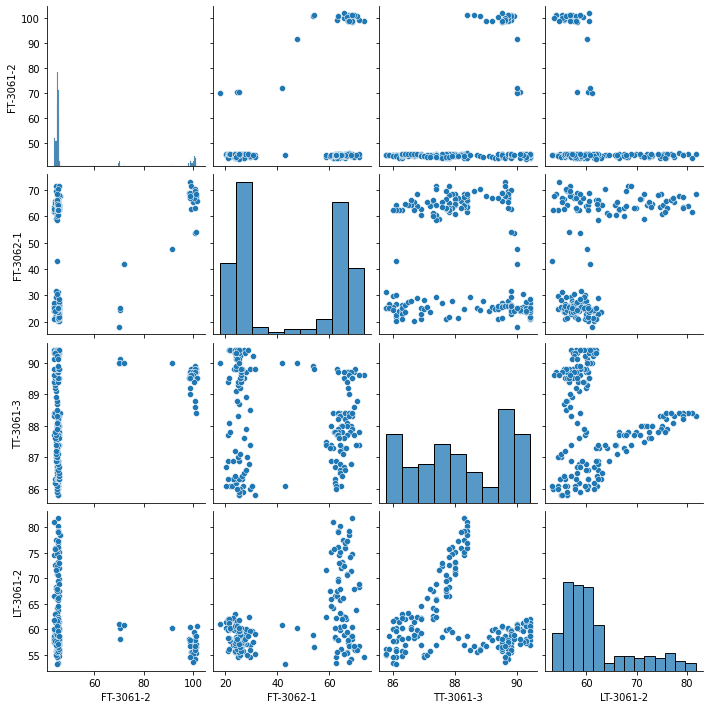

dataset 11


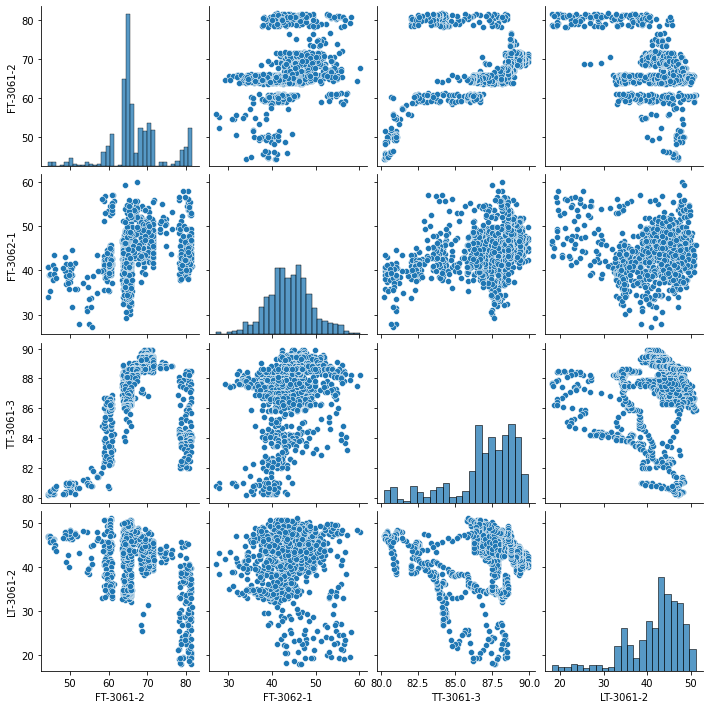

dataset 12


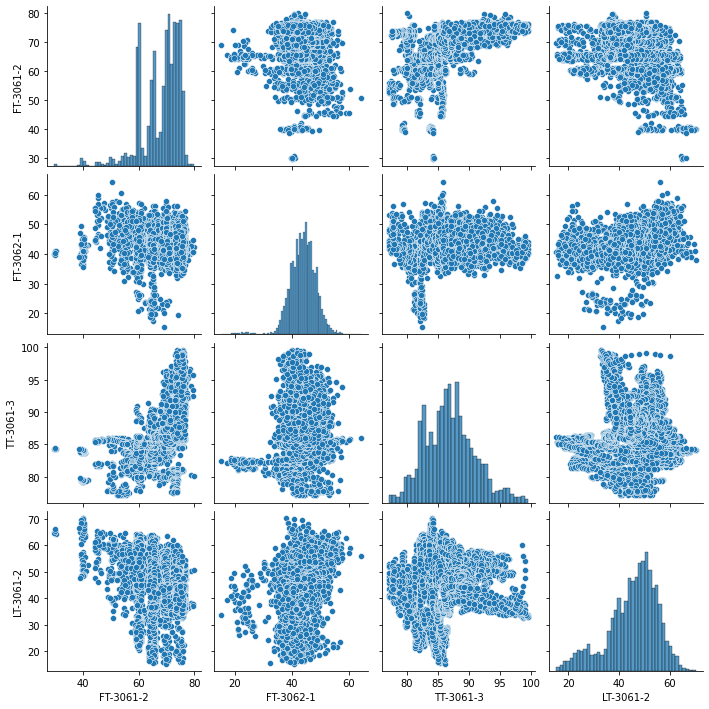

dataset 13


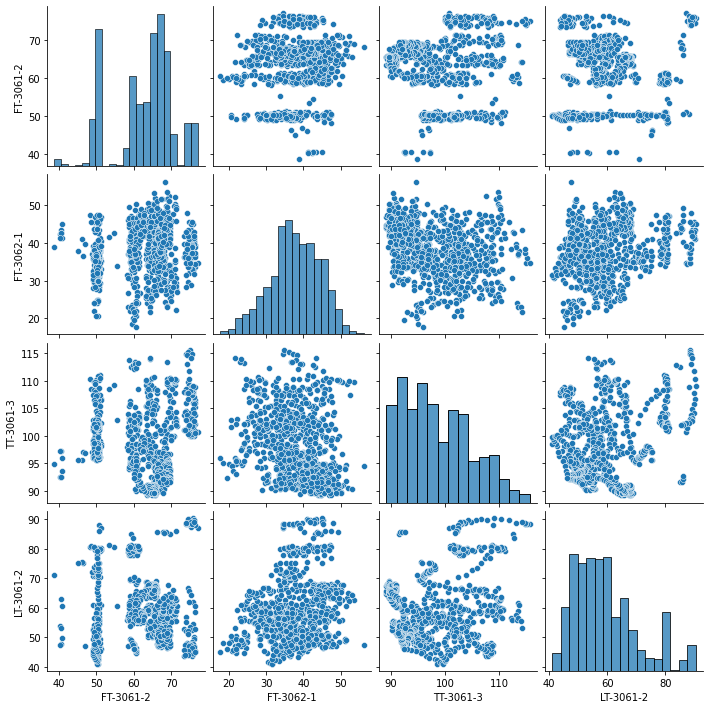

dataset 14


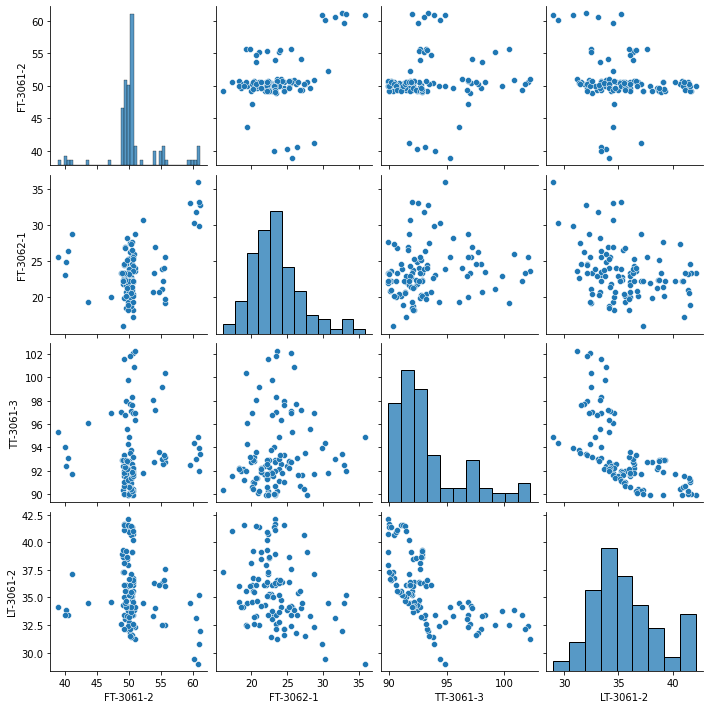

dataset 15


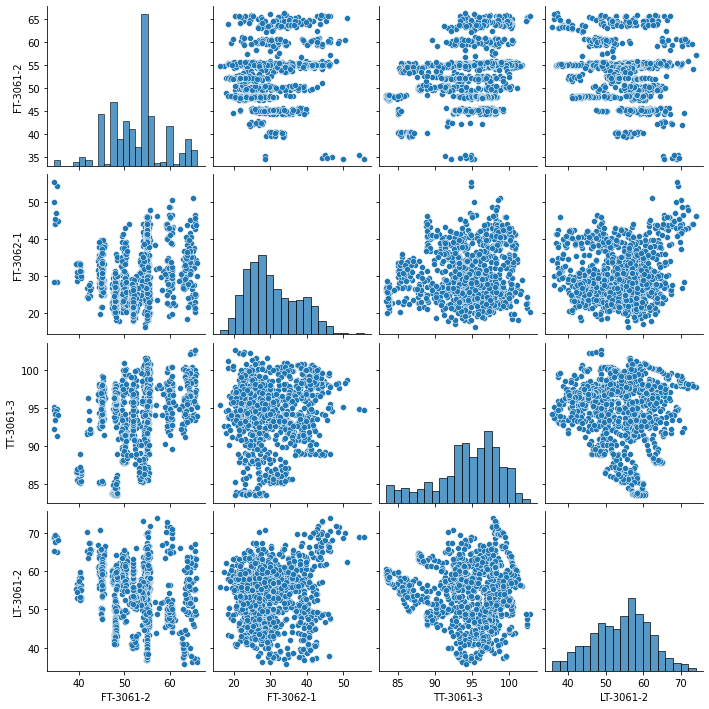

dataset 16


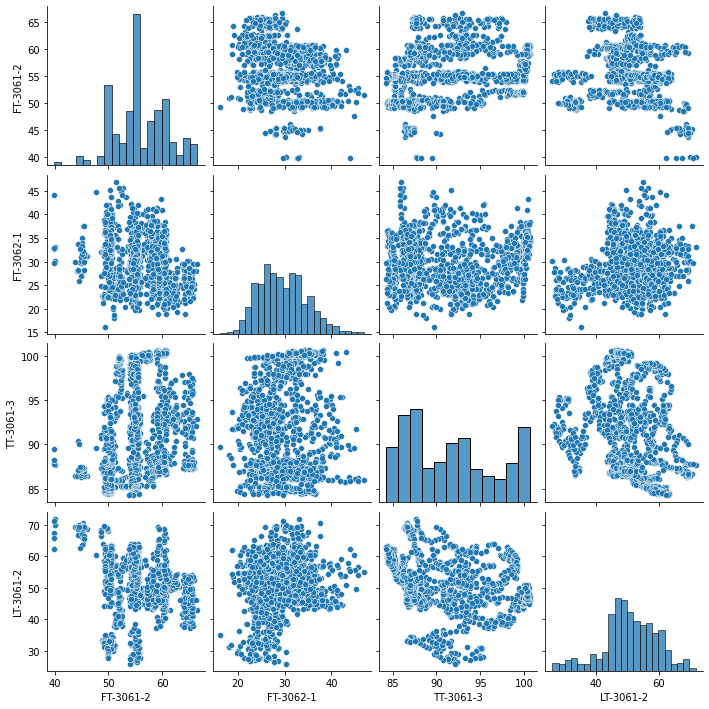

dataset 17


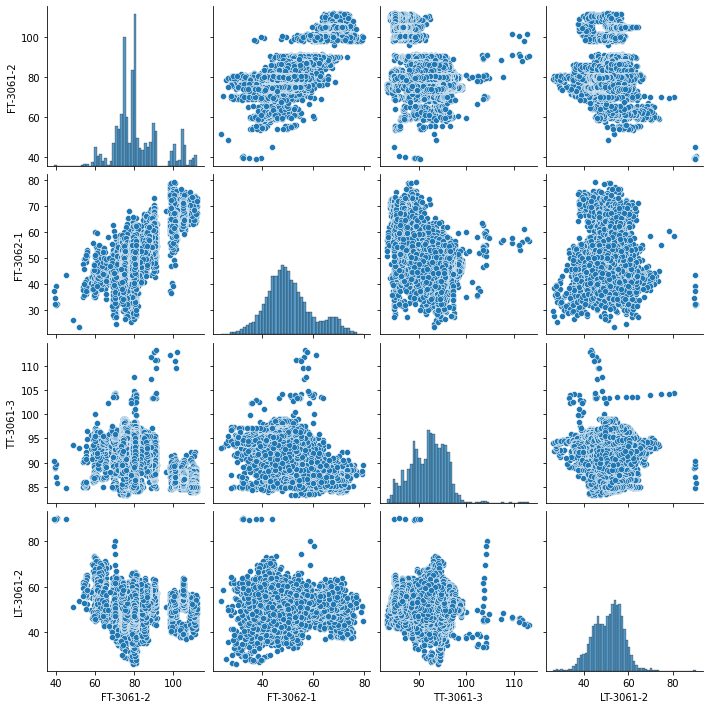

dataset 18


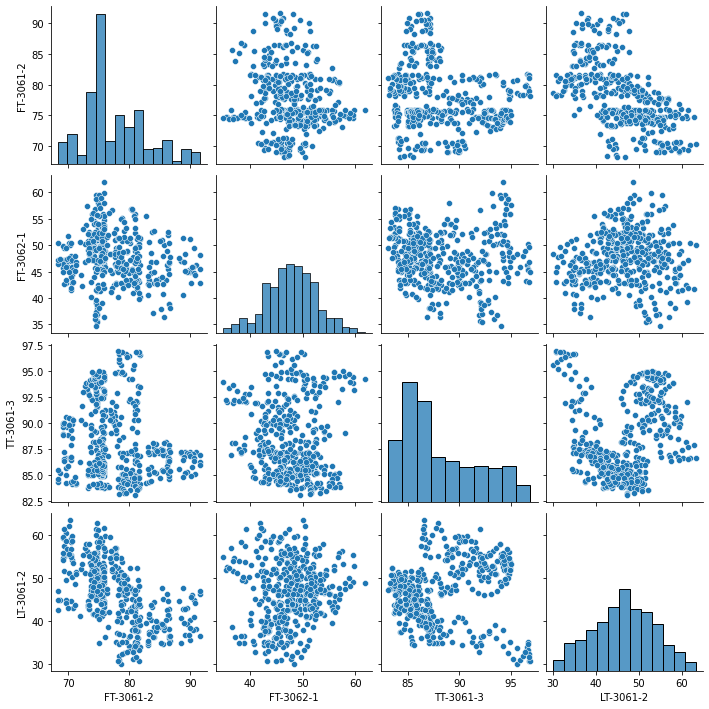

dataset 19


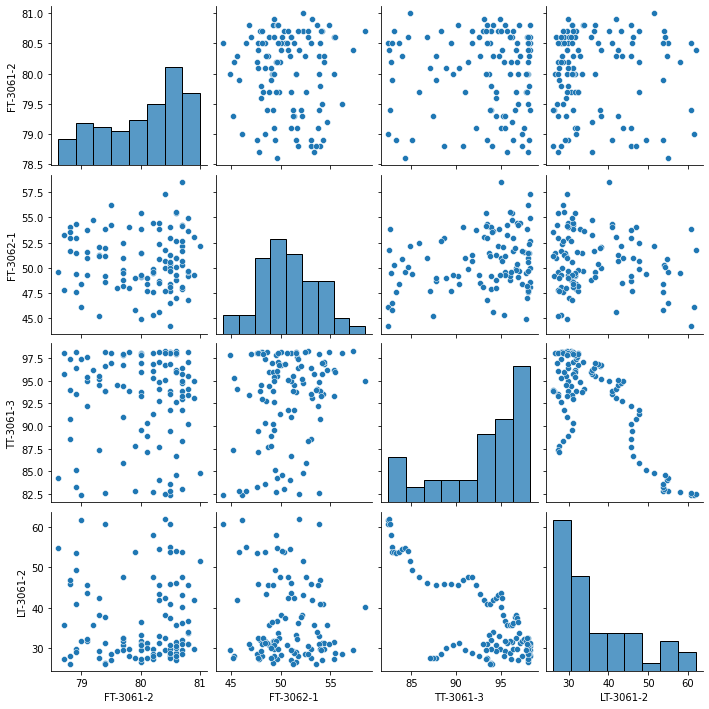

dataset 20


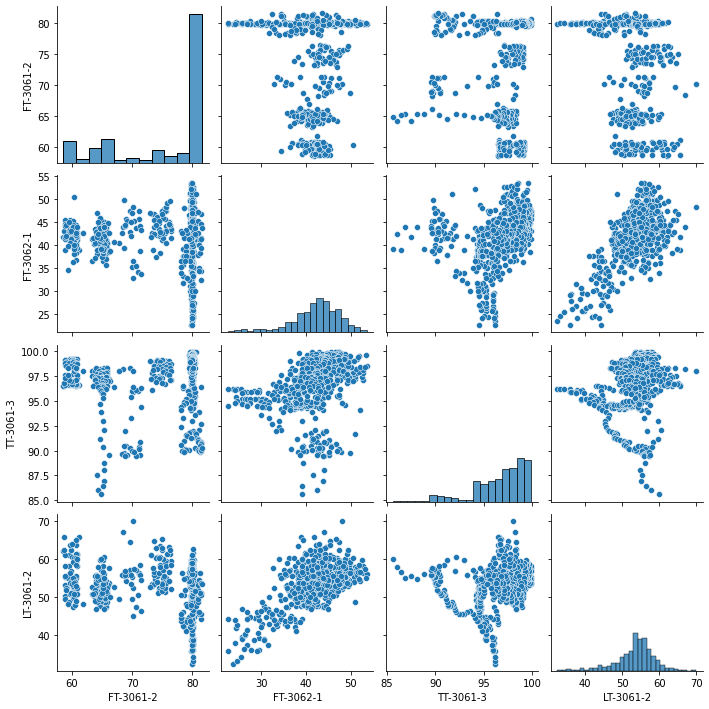

dataset 21


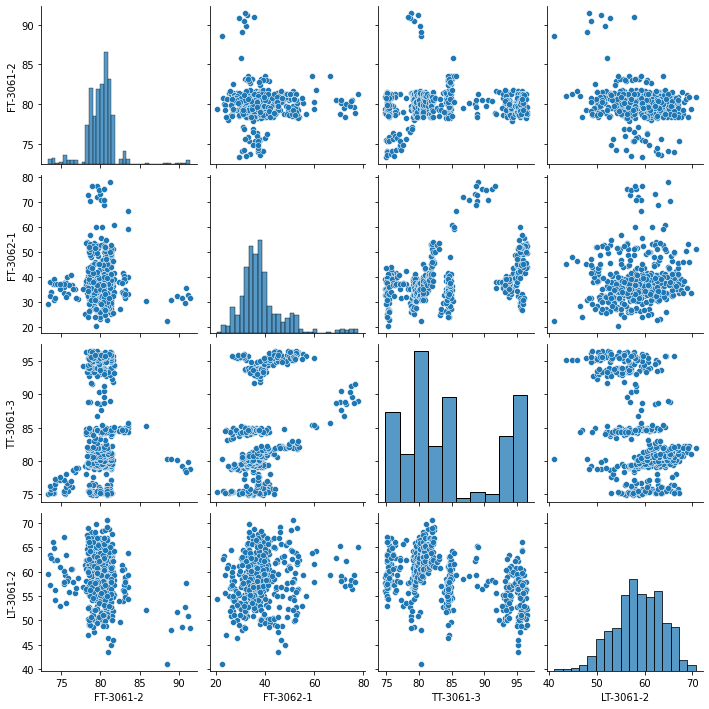

dataset 22


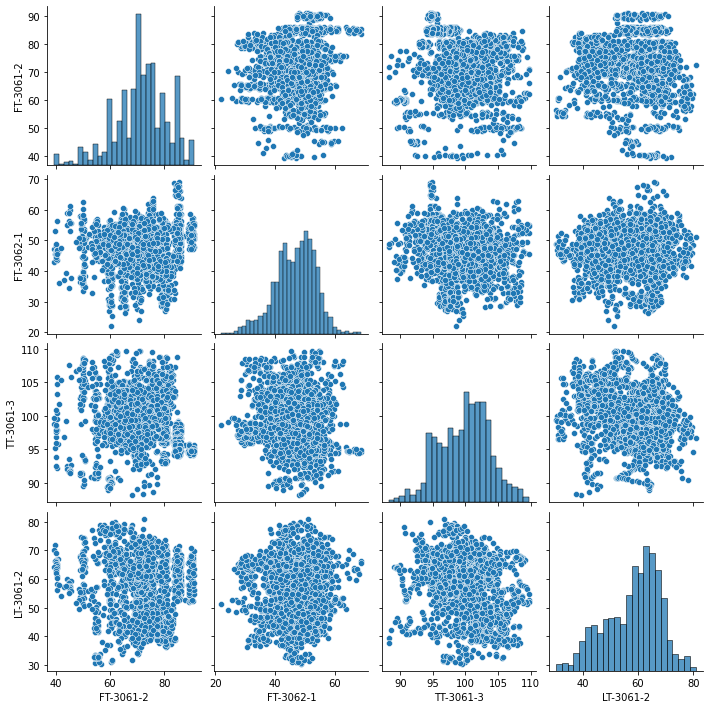

dataset 23


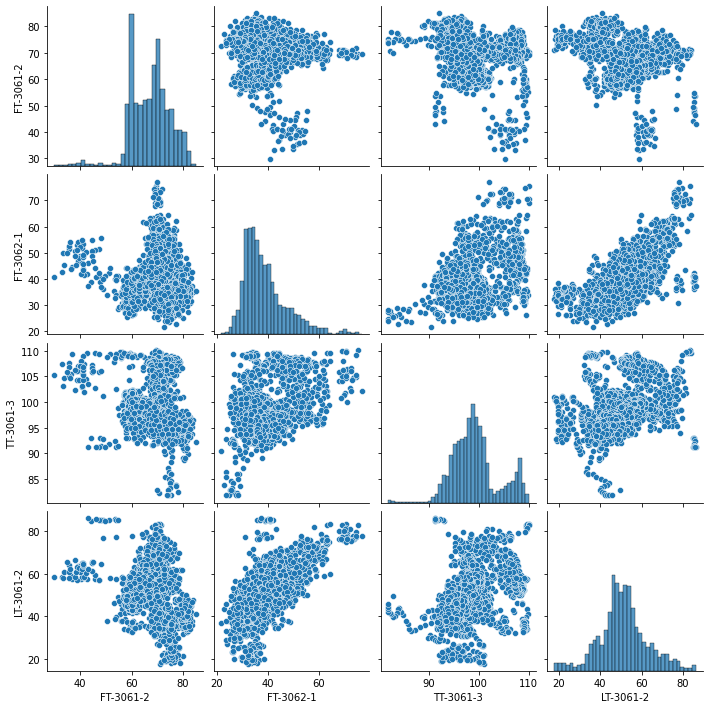

dataset 24


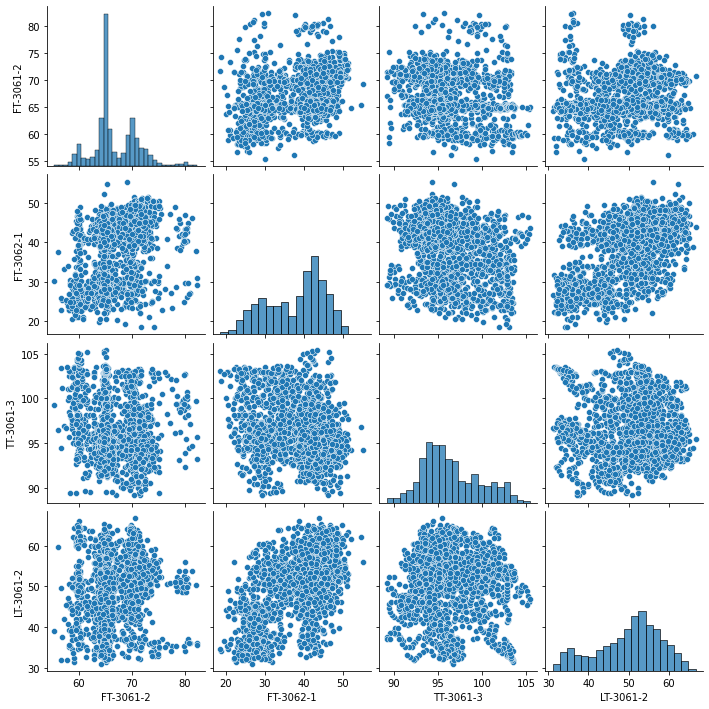

In [19]:
for i, cts_df in enumerate(cts_list):
    print(f"dataset {i+1}")
    sns.pairplot(cts_df[["FT-3061-2", "FT-3062-1", "TT-3061-3", "LT-3061-2"]])
    plt.show()

## Denoise

In [22]:
from src.dataprocessing import EMA

denoise_path = data_path + '/4_denoise'

target_list = cts_list
target_var = process_var
alpha_list = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99, 0.999]

for alpha in alpha_list:
    ema_list = []
    
    if not exists(f"{denoise_path}/denoise_{alpha}"):
        createfolder(denoise_path + f'/denoise_{alpha}')
        for i, target_df in enumerate(target_list):
            ema_df = EMA(target_df, alpha, target_var=target_var)
            ema_list.append(ema_df)
            savefile(ema_df, denoise_path, f"denoise_{alpha}/dataset {alpha}_{i+1}")           

csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_1.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_2.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_3.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_4.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_5.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_6.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_7.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_8.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_9.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_10.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_11.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_12.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_13.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_14.csv
csv file is saved to: ./data/4_denoise/denoise_0/dataset 0_15.csv
csv file is saved t

In [23]:
target_list = cts_list
target_var = process_var
alpha = 0.5

ema_list = []
for target_df in target_list:
    ema_df = EMA(target_df, alpha, target_var=target_var)
    ema_list.append(ema_df)